In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf


%matplotlib inline
%config InlineBackend.figure_format='retina'


from pathlib import Path

%matplotlib inline

In [2]:
# Take a peek at 2017
df1 = pd.read_csv('data/gender-pay-gap-uk-gov/2017.csv.gz',  compression='gzip')
df2 = pd.read_csv('data/gender-pay-gap-uk-gov/2018.csv.gz',  compression='gzip')
df3 = pd.read_csv('data/gender-pay-gap-uk-gov/2019.csv.gz',  compression='gzip')
df1['year'] = 2017
df2['year'] = 2018
df3['year'] = 2019
df = pd.concat([df1, df2, df3])
#del df1, df2, df3
df.head()

,EmployerName,Address,CompanyNumber,SicCodes,DiffMeanHourlyPercent,DiffMedianHourlyPercent,DiffMeanBonusPercent,DiffMedianBonusPercent,MaleBonusPercent,FemaleBonusPercent,...,MaleTopQuartile,FemaleTopQuartile,CompanyLinkToGPGInfo,ResponsiblePerson,EmployerSize,CurrentName,SubmittedAfterTheDeadline,DueDate,DateSubmitted,year
0,"""Bryanston School"",Incorporated","Bryanston House,\r\nBlandford,\r\nDorset,\r\nD...",00226143,85310,18.0,28.2,0.0,0.0,0.0,0.0,...,51.5,48.5,https://www.bryanston.co.uk/employment,Nick McRobb (Bursar and Clerk to the Governors),500 to 999,BRYANSTON SCHOOL INCORPORATED,False,05/04/2018 00:00:00,27/03/2018 11:42:49,2017
1,"""RED BAND"" CHEMICAL COMPANY, LIMITED","19 Smith's Place,\r\nLeith Walk,\r\nEdinburgh,...",SC016876,47730,2.3,-2.7,15.0,37.5,15.6,66.7,...,18.1,81.9,NaN,Philip Galt (Managing Director),250 to 499,"""RED BAND"" CHEMICAL COMPANY, LIMITED",False,05/04/2018 00:00:00,28/03/2018 16:44:25,2017
2,118 LIMITED,"3 Alexandra Gate Ffordd Pengam,\r\nGround Floo...",03951948,61900,1.7,2.8,13.1,13.6,70.0,57.0,...,58.0,42.0,NaN,"Emma Crowe (VP, Human Resources)",500 to 999,118 LIMITED,False,05/04/2018 00:00:00,27/03/2018 19:10:41,2017
3,123 EMPLOYEES LTD,"34 Roundhay Road,\r\nLeeds,\r\nEngland,\r\nLS7...",10530651,78300,41.0,36.0,-69.8,-157.2,50.0,73.5,...,23.0,77.0,NaN,Chloe Lines (Financial Controller),250 to 499,123 EMPLOYEES LTD,True,05/04/2018 00:00:00,04/05/2018 11:24:06,2017
4,1610 LIMITED,"Hestercombe House,\r\nCheddon Fitzpaine,\r\nTa...",06727055,93110,-22.0,-34.0,-47.0,-67.0,25.0,75.0,...,24.0,76.0,https://www.1610.org.uk/gender-pay-gap/,Tim Nightingale (CEO),250 to 499,1610 LIMITED,True,05/04/2018 00:00:00,12/04/2018 17:03:26,2017


In [3]:
df1.describe()

,DiffMeanHourlyPercent,DiffMedianHourlyPercent,DiffMeanBonusPercent,DiffMedianBonusPercent,MaleBonusPercent,FemaleBonusPercent,MaleLowerQuartile,FemaleLowerQuartile,MaleLowerMiddleQuartile,FemaleLowerMiddleQuartile,MaleUpperMiddleQuartile,FemaleUpperMiddleQuartile,MaleTopQuartile,FemaleTopQuartile,year
count,10562.000000,10562.000000,10542.000000,10542.000000,10562.000000,10562.000000,10562.000000,10562.000000,10562.000000,10562.000000,10562.000000,10562.000000,10562.000000,10562.000000,10562.0
mean,14.343496,11.794887,7.662189,-21.754250,35.381235,33.915111,46.330572,53.669428,50.520365,49.479635,54.863861,45.136139,60.815518,39.184482,2017.0
std,14.921568,15.842495,833.649838,1400.033523,36.327997,36.012276,24.128792,24.128792,26.091683,26.091683,26.223457,26.223457,24.400385,24.400385,0.0
min,-400.000000,-196.500000,-82000.000000,-120695.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2017.0
25%,5.000000,0.700000,0.000000,0.000000,0.800000,0.300000,27.000000,35.700000,29.500000,27.625000,34.000000,21.500000,41.500000,17.125000,2017.0
50%,13.300000,9.200000,22.000000,5.000000,19.300000,17.200000,44.300000,55.700000,48.300000,51.700000,54.000000,46.000000,62.700000,37.300000,2017.0
75%,22.900000,21.000000,53.000000,38.000000,73.200000,70.000000,64.300000,73.000000,72.375000,70.500000,78.500000,66.000000,82.875000,58.500000,2017.0
max,159.000000,121.200000,3848.200000,3848.200000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,2017.0


In [4]:
df1.loc[df1['DiffMeanBonusPercent'].isnull()]

,EmployerName,Address,CompanyNumber,SicCodes,DiffMeanHourlyPercent,DiffMedianHourlyPercent,DiffMeanBonusPercent,DiffMedianBonusPercent,MaleBonusPercent,FemaleBonusPercent,...,MaleTopQuartile,FemaleTopQuartile,CompanyLinkToGPGInfo,ResponsiblePerson,EmployerSize,CurrentName,SubmittedAfterTheDeadline,DueDate,DateSubmitted,year
1069,BISHOP FLEMING LLP,"2nd Floor Stratus House Emperor Way,\r\nExeter...",OC391282,NaN,17.0,20.3,NaN,NaN,0.0,0.0,...,68.0,32.0,https://www.bishopfleming.co.uk/gender-pay-report,Andrew Sandiford (Managing Partner),250 to 499,BISHOP FLEMING LLP,True,05/04/2018 00:00:00,02/04/2019 14:28:22,2017
1076,Black Country Partnership NHS Foundation Trust,"Greets Green Rd,\r\nWest Bromwich,\r\nWest Mid...",NaN,1,11.4,3.4,NaN,NaN,0.0,0.0,...,27.3,72.7,https://www.bcpft.nhs.uk/about-us/equality-and...,NaN,1000 to 4999,Black Country Partnership NHS Foundation Trust,True,31/03/2018 00:00:00,29/03/2019 16:59:43,2017
1103,Blessed Peter Snow Catholic Academy Trust,"St John Fisher Catholic Voluntary Academy,\r\n...",09068195,"1,\r\n85310",29.0,40.0,NaN,NaN,0.0,0.0,...,31.0,69.0,NaN,NaN,Less than 250,BLESSED PETER SNOW CATHOLIC ACADEMY TRUST,False,31/03/2018 00:00:00,28/03/2019 10:52:36,2017
1380,Brothers of Charity Services in Lancashire,"Lisieux Hall,\r\nDawson Lane,\r\nWhittle-le-Wo...",NaN,"87100,\r\n87200,\r\n88990",34.9,-2.7,NaN,NaN,0.0,0.0,...,20.5,79.5,https://brothersofcharity.org.uk/lancashire/ab...,Darron Grundy (CEO),500 to 999,Brothers of Charity Services in Lancashire,True,05/04/2018 00:00:00,03/04/2019 16:42:49,2017
1640,CARE PRECIOUS LTD,"Caremark (East Riding) Unit 4 Priory Court,\r\...",06859130,96090,14.5,0.0,NaN,NaN,0.0,0.0,...,100.0,0.0,NaN,Kris Darnell (Finance Director),250 to 499,CARE PRECIOUS LTD,True,05/04/2018 00:00:00,02/04/2019 12:49:28,2017
2031,CLASS 1 PERSONNEL ( HAMMERSMITH ) LTD,"Ashley House,\r\n86-94 High Street,\r\nHounslo...",09144564,78200,-0.8,0.0,NaN,NaN,0.0,0.0,...,45.0,55.0,https://www.class1personnel.com/blog/2018/04/b...,Padma Akella (finance director),250 to 499,CLASS 1 PERSONNEL ( HAMMERSMITH ) LTD,True,05/04/2018 00:00:00,04/04/2019 16:08:26,2017
2142,COMPAID TRUST,NaN,CE017213,NaN,6.8,0.0,NaN,NaN,0.0,0.0,...,46.0,54.0,NaN,Stephen Elsden (Chief Executive),Less than 250,COMPAID TRUST,False,05/04/2018 00:00:00,26/07/2019 12:26:44,2017
4222,HIGHLANDS AND ISLANDS AIRPORTS LIMITED,"Head Office,\r\nInverness Airport,\r\nInvernes...",SC097647,52230,19.7,16.1,NaN,NaN,0.0,0.0,...,88.0,12.0,http://www.hial.co.uk,Inglis Lyon (Managing Director),500 to 999,HIGHLANDS AND ISLANDS AIRPORTS LIMITED,True,05/04/2018 00:00:00,04/04/2019 15:47:49,2017
4383,Hull College Group,"Queen's Gardens,\r\nWilberforce Drive,\r\nHull...",NaN,"1,\r\n85310",6.2,18.9,NaN,NaN,0.0,0.0,...,44.9,55.1,https://www.hull-college.ac.uk,NaN,1000 to 4999,Hull College Group,True,31/03/2018 00:00:00,25/03/2019 16:22:57,2017
4948,Kenton Schools Academy Trust,"Kenton School Newcastle,\r\nDrayton Road,\r\nN...",07964133,"1,\r\n85310",14.8,14.1,NaN,NaN,0.0,0.0,...,44.1,55.9,NaN,NaN,250 to 499,KENTON SCHOOLS ACADEMY TRUST,True,31/03/2018 00:00:00,27/03/2019 11:46:18,2017


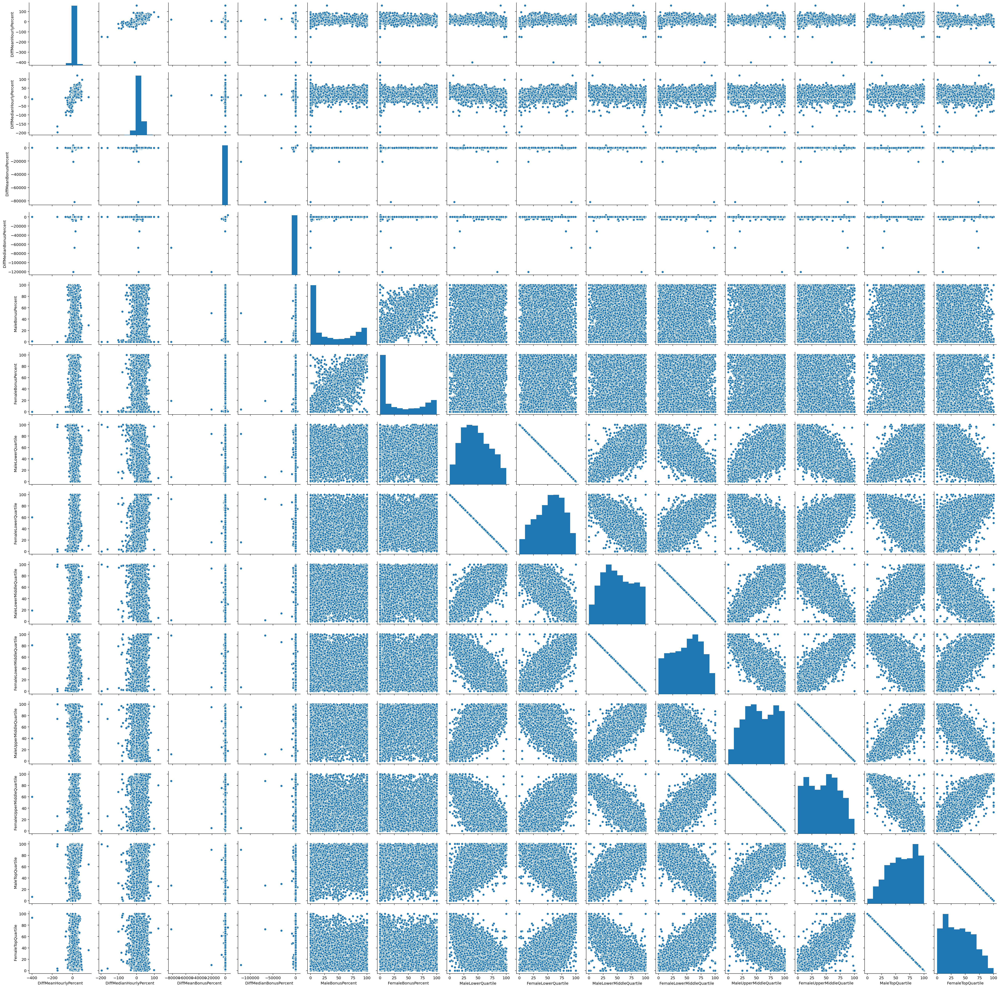

In [5]:
sns.pairplot(df[df.year==2017][[ 'DiffMeanHourlyPercent', 'DiffMedianHourlyPercent',
       'DiffMeanBonusPercent', 'DiffMedianBonusPercent',
       'MaleBonusPercent', 'FemaleBonusPercent', 'MaleLowerQuartile',
       'FemaleLowerQuartile', 'MaleLowerMiddleQuartile',
       'FemaleLowerMiddleQuartile', 'MaleUpperMiddleQuartile',
       'FemaleUpperMiddleQuartile', 'MaleTopQuartile',
       'FemaleTopQuartile','EmployerSize']].dropna())

plt.show()

In [6]:
# Import the dataset
mnist = tf.keras.datasets.mnist

# Split into test and train
(x_train, y_train), (x_test, y_test) = mnist.load_data()
x_train, x_test = x_train / 255.0, x_test / 255.0

# Set out the architecture of the Neural Nework 
model = tf.keras.models.Sequential([ # sequential is for feedforward
  tf.keras.layers.Flatten(input_shape=(28, 28)), # this is the shape of the data - we are using 28*28 images with each pixel representing a data point
  tf.keras.layers.Dense(128, activation='relu'), # adding another layer with 128 nodes and a relu activation function
  tf.keras.layers.Dropout(0.2), # adding a dropout rate of 20%
  tf.keras.layers.Dense(10, activation='softmax') # adding a final layer with 10 nodes and a softmax activation function
])

model.compile(optimizer='adam', # optimizer explains the formula for learning
              loss='sparse_categorical_crossentropy', # loss defines the weights for the loss function
              metrics=['accuracy']) # metrics are what is tested throughout the learning process

model.fit(x_train, y_train, epochs=5) # epochs is how many runs the model goes through 

model.evaluate(x_test,  y_test, verbose=2) # this runs the data from the test dataset through the model and evaluates it

Train on 60000 samples
Epoch 1/5
60000/60000 [==============================] - 2s 36us/sample - loss: 0.3004 - accuracy: 0.9139
Epoch 2/5
60000/60000 [==============================] - 2s 33us/sample - loss: 0.1446 - accuracy: 0.9572
Epoch 3/5
60000/60000 [==============================] - 2s 33us/sample - loss: 0.1086 - accuracy: 0.9672
Epoch 4/5
60000/60000 [==============================] - 2s 33us/sample - loss: 0.0890 - accuracy: 0.9727
Epoch 5/5
60000/60000 [==============================] - 2s 33us/sample - loss: 0.0764 - accuracy: 0.9758
10000/10000 - 0s - loss: 0.0745 - accuracy: 0.9767


[0.07452834453596734, 0.9767]

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [8]:
url = 'data/gender-pay-gap-uk-gov/2018.csv.gz'
data = pd.read_csv(url, compression='gzip')
data.head()

,EmployerName,Address,CompanyNumber,SicCodes,DiffMeanHourlyPercent,DiffMedianHourlyPercent,DiffMeanBonusPercent,DiffMedianBonusPercent,MaleBonusPercent,FemaleBonusPercent,...,FemaleUpperMiddleQuartile,MaleTopQuartile,FemaleTopQuartile,CompanyLinkToGPGInfo,ResponsiblePerson,EmployerSize,CurrentName,SubmittedAfterTheDeadline,DueDate,DateSubmitted
0,"""Bryanston School"",Incorporated","Bryanston House,\r\nBlandford,\r\nDorset,\r\nD...",00226143,85310,19.6,32.5,NaN,NaN,0.0,0.0,...,55.1,53.3,46.7,https://www.bryanston.co.uk/employment,Michael McGovern (Chief Operating Officer),500 to 999,BRYANSTON SCHOOL INCORPORATED,False,05/04/2019 00:00:00,03/04/2019 13:43:34
1,"""RED BAND"" CHEMICAL COMPANY, LIMITED","19 Smith's Place,\r\nLeith Walk,\r\nEdinburgh,...",SC016876,47730,7.7,-4.2,23.7,-75.2,22.2,82.0,...,88.4,20.3,79.7,NaN,Philip Galt (Managing Director),250 to 499,"""RED BAND"" CHEMICAL COMPANY, LIMITED",False,05/04/2019 00:00:00,01/04/2019 12:37:21
2,118 LIMITED,"3 Alexandra Gate Ffordd Pengam,\r\nGround Floo...",03951948,61900,7.7,12.7,11.3,10.9,67.0,52.0,...,50.0,56.0,44.0,NaN,Michael Graham (CEO),1000 to 4999,118 LIMITED,False,05/04/2019 00:00:00,06/03/2019 13:26:24
3,123 EMPLOYEES LTD,"34 Roundhay Road,\r\nLeeds,\r\nEngland,\r\nLS7...",10530651,78300,30.0,29.0,-10.0,69.0,46.0,74.0,...,83.0,25.0,75.0,NaN,Chloe Lines (Financial Controller),250 to 499,123 EMPLOYEES LTD,False,05/04/2019 00:00:00,03/04/2019 15:43:17
4,1509 GROUP,"Royal Grammar School,\r\nHigh Street,\r\nGuild...",04104101,"85200,\r\n85310",13.4,12.7,0.0,0.0,0.0,0.0,...,51.6,61.3,38.7,https://www.rgs-guildford.co.uk,Kate Perceval (Bursar),250 to 499,1509 GROUP,False,05/04/2019 00:00:00,18/03/2019 14:03:16


In [9]:
del_cols = ["ResponsiblePerson","SubmittedAfterTheDeadline","DueDate","DateSubmitted"]
data.drop(del_cols, axis=1, inplace=True)
data.shape

(10817, 21)

In [10]:
data.describe()

,DiffMeanHourlyPercent,DiffMedianHourlyPercent,DiffMeanBonusPercent,DiffMedianBonusPercent,MaleBonusPercent,FemaleBonusPercent,MaleLowerQuartile,FemaleLowerQuartile,MaleLowerMiddleQuartile,FemaleLowerMiddleQuartile,MaleUpperMiddleQuartile,FemaleUpperMiddleQuartile,MaleTopQuartile,FemaleTopQuartile
count,10817.000000,10817.000000,9068.000000,9068.000000,10817.000000,10817.000000,10817.000000,10817.000000,10817.00000,10817.00000,10817.000000,10817.000000,10817.000000,10817.000000
mean,14.182555,11.882851,18.401390,-1.033855,35.706749,34.378941,46.115568,53.884432,50.17099,49.82901,54.384718,45.615282,60.253000,39.747000
std,14.243119,15.512442,219.025483,295.383196,36.675086,36.375891,24.113495,24.113495,26.19021,26.19021,26.318576,26.318576,24.487098,24.487098
min,-98.700000,-92.300000,-13934.000000,-14490.800000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000
25%,4.900000,0.900000,0.000000,0.000000,0.700000,0.300000,27.000000,35.500000,29.00000,28.00000,33.000000,22.000000,41.000000,18.000000
50%,13.100000,9.500000,32.050000,15.550000,19.200000,17.100000,44.600000,55.400000,48.00000,52.00000,53.000000,47.000000,62.000000,38.000000
75%,22.400000,21.000000,56.600000,43.000000,75.100000,71.900000,64.500000,73.000000,72.00000,71.00000,78.000000,67.000000,82.000000,59.000000
max,100.000000,100.000000,134.200000,4000.000000,100.000000,100.000000,100.000000,100.000000,100.00000,100.00000,100.000000,100.000000,100.000000,100.000000


In [11]:
new_data = data[['SicCodes','DiffMeanHourlyPercent','DiffMedianHourlyPercent','DiffMeanBonusPercent','DiffMedianBonusPercent',
                 'MaleBonusPercent','FemaleBonusPercent','MaleLowerQuartile','FemaleLowerQuartile',
       'MaleLowerMiddleQuartile', 'FemaleLowerMiddleQuartile',
       'MaleUpperMiddleQuartile', 'FemaleUpperMiddleQuartile',
       'MaleTopQuartile', 'FemaleTopQuartile','EmployerSize']]
new_data.dropna(axis=0, inplace = True) #droping missing values everywhere
print(new_data.shape)

(8657, 16)


/opt/anaconda3/envs/tensorflow/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [12]:
#picked up on the internet
def sic_desc(df,sic):
    
    df = df[~df.SicCodes.isna()]
    
    df['SicCodes'] = df.apply(lambda row: row.SicCodes.replace('\n','')\
                                                      .replace('\r','')\
                                                      .split(','), axis=1)
    df = df.explode('SicCodes')
    df['SicCodes'] = pd.to_numeric(df.SicCodes)
    
    return df.merge(sic, how='left', left_on='SicCodes', 
                    right_on='SIC Code')

In [13]:
siccodeUrl = "data/siccodes/SIC07_CH_condensed_list_en.csv"
siccode = pd.read_csv(siccodeUrl)
siccode.head()

,SIC Code,Description
0,1110,"Growing of cereals (except rice), leguminous c..."
1,1120,Growing of rice
2,1130,"Growing of vegetables and melons, roots and tu..."
3,1140,Growing of sugar cane
4,1150,Growing of tobacco


In [14]:
new_data = sic_desc(new_data,siccode)

In [15]:
#https://www.datacamp.com/community/tutorials/categorical-data
#used label encoding but would one hot encoding be better
new_data['EmployerSize'] = new_data['EmployerSize'].astype('category')
print(new_data['EmployerSize'].unique())
new_data['EmployerSize'] = new_data['EmployerSize'].cat.codes
print(new_data['EmployerSize'].unique())

[250 to 499, 1000 to 4999, 500 to 999, 5000 to 19,999, Less than 250, 20,000 or more, Not Provided]
Categories (7, object): [250 to 499, 1000 to 4999, 500 to 999, 5000 to 19,999, Less than 250, 20,000 or more, Not Provided]
[2 0 3 4 5 1 6]


In [16]:
new_data.describe()

,SicCodes,DiffMeanHourlyPercent,DiffMedianHourlyPercent,DiffMeanBonusPercent,DiffMedianBonusPercent,MaleBonusPercent,FemaleBonusPercent,MaleLowerQuartile,FemaleLowerQuartile,MaleLowerMiddleQuartile,FemaleLowerMiddleQuartile,MaleUpperMiddleQuartile,FemaleUpperMiddleQuartile,MaleTopQuartile,FemaleTopQuartile,EmployerSize,SIC Code
count,12758.000000,12758.000000,12758.000000,12758.000000,12758.000000,12758.000000,12758.000000,12758.000000,12758.000000,12758.000000,12758.000000,12758.000000,12758.000000,12758.000000,12758.000000,12758.000000,11616.000000
mean,55738.576736,15.021320,12.404664,19.206662,0.130350,39.992710,38.104805,47.931541,52.068459,52.266970,47.733030,56.675506,43.324494,62.562878,37.437122,1.968020,61218.286846
std,28245.663998,14.015477,15.279077,189.475172,267.553667,36.244665,35.987443,23.972897,23.972897,25.981412,25.981412,26.243435,26.243435,24.054340,24.054340,1.303241,23254.633834
min,1.000000,-98.700000,-92.300000,-13934.000000,-14490.800000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1110.000000
25%,41201.000000,6.000000,1.800000,0.000000,0.000000,4.700000,3.000000,29.000000,33.200000,31.425000,25.325000,35.700000,19.300000,43.100000,15.900000,2.000000,45320.000000
50%,58142.000000,14.200000,10.500000,31.000000,14.600000,28.400000,26.000000,47.000000,53.000000,51.000000,49.000000,56.000000,44.000000,65.150000,34.850000,2.000000,64150.500000
75%,82990.000000,23.200000,21.400000,56.100000,43.000000,78.100000,75.075000,66.800000,71.000000,74.675000,68.575000,80.700000,64.300000,84.100000,56.900000,3.000000,82990.000000
max,99999.000000,100.000000,100.000000,134.200000,4000.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,6.000000,99999.000000


In [17]:
new_data.dropna(axis=0) #dropping ones without siccode

,SicCodes,DiffMeanHourlyPercent,DiffMedianHourlyPercent,DiffMeanBonusPercent,DiffMedianBonusPercent,MaleBonusPercent,FemaleBonusPercent,MaleLowerQuartile,FemaleLowerQuartile,MaleLowerMiddleQuartile,FemaleLowerMiddleQuartile,MaleUpperMiddleQuartile,FemaleUpperMiddleQuartile,MaleTopQuartile,FemaleTopQuartile,EmployerSize,SIC Code,Description
0,47730,7.7,-4.2,23.7,-75.2,22.2,82.0,31.6,68.4,12.7,87.3,11.6,88.4,20.3,79.7,2,47730.0,Dispensing chemist in specialised stores
1,61900,7.7,12.7,11.3,10.9,67.0,52.0,41.0,59.0,45.0,55.0,50.0,50.0,56.0,44.0,0,61900.0,Other telecommunications activities
2,78300,30.0,29.0,-10.0,69.0,46.0,74.0,0.0,100.0,2.0,98.0,17.0,83.0,25.0,75.0,2,78300.0,Human resources provision and management of hu...
3,85200,13.4,12.7,0.0,0.0,0.0,0.0,38.1,61.9,43.6,56.4,48.4,51.6,61.3,38.7,2,85200.0,Primary education
4,85310,13.4,12.7,0.0,0.0,0.0,0.0,38.1,61.9,43.6,56.4,48.4,51.6,61.3,38.7,2,85310.0,General secondary education
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12753,78300,26.6,29.6,56.9,53.2,95.0,94.0,36.9,63.1,38.8,61.2,54.4,45.6,70.9,29.1,0,78300.0,Human resources provision and management of hu...
12754,82990,26.6,29.6,56.9,53.2,95.0,94.0,36.9,63.1,38.8,61.2,54.4,45.6,70.9,29.1,0,82990.0,Other business support service activities n.e.c.
12755,82990,22.3,23.8,51.6,50.6,95.0,96.0,37.9,62.1,61.8,38.2,71.0,29.0,70.2,29.8,0,82990.0,Other business support service activities n.e.c.
12756,70100,25.0,21.0,48.0,56.0,58.0,84.0,41.0,59.0,62.0,38.0,72.0,28.0,80.0,20.0,2,70100.0,Activities of head offices


In [18]:
new_data['FemalePerc']= 0.25 * (new_data.FemaleLowerQuartile + new_data.FemaleLowerMiddleQuartile +
                          new_data.FemaleUpperMiddleQuartile + new_data.FemaleTopQuartile)

In [19]:
new_data['MalePerc'] = 100 - new_data['FemalePerc']

In [20]:
new_data.head()

,SicCodes,DiffMeanHourlyPercent,DiffMedianHourlyPercent,DiffMeanBonusPercent,DiffMedianBonusPercent,MaleBonusPercent,FemaleBonusPercent,MaleLowerQuartile,FemaleLowerQuartile,MaleLowerMiddleQuartile,FemaleLowerMiddleQuartile,MaleUpperMiddleQuartile,FemaleUpperMiddleQuartile,MaleTopQuartile,FemaleTopQuartile,EmployerSize,SIC Code,Description,FemalePerc,MalePerc
0,47730,7.7,-4.2,23.7,-75.2,22.2,82.0,31.6,68.4,12.7,87.3,11.6,88.4,20.3,79.7,2,47730.0,Dispensing chemist in specialised stores,80.95,19.05
1,61900,7.7,12.7,11.3,10.9,67.0,52.0,41.0,59.0,45.0,55.0,50.0,50.0,56.0,44.0,0,61900.0,Other telecommunications activities,52.00,48.00
2,78300,30.0,29.0,-10.0,69.0,46.0,74.0,0.0,100.0,2.0,98.0,17.0,83.0,25.0,75.0,2,78300.0,Human resources provision and management of hu...,89.00,11.00
3,85200,13.4,12.7,0.0,0.0,0.0,0.0,38.1,61.9,43.6,56.4,48.4,51.6,61.3,38.7,2,85200.0,Primary education,52.15,47.85
4,85310,13.4,12.7,0.0,0.0,0.0,0.0,38.1,61.9,43.6,56.4,48.4,51.6,61.3,38.7,2,85310.0,General secondary education,52.15,47.85


In [397]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
from math import sqrt
# https://www.kaggle.com/learn/intro-to-machine-learning

In [398]:
def decision_tree(train_X, val_X, train_y, val_y):
    # Define model. Specify a number for random_state to ensure same results each run
    model = DecisionTreeRegressor(random_state=1, max_depth=10, min_samples_split=10)

    # Fit model
    model.fit(train_X, train_y)

    # get predicted prices on validation data
    val_predictions = model.predict(val_X)
    print("Decision tree mean absolute error:",mean_absolute_error(val_y, val_predictions))
    print("Decision tree root mean squared error:",sqrt(mean_squared_error(val_y, val_predictions)))
    #print("Decision tree AIC:",aic(val_y, val_predictions, len(val_X.columns)))
    print("Decision tree R^2 score: ",model.score(val_X, val_y))
    return model

In [399]:
def random_forest(train_X, val_X, train_y, val_y):
    forest_model = RandomForestRegressor(random_state=1)
    forest_model.fit(train_X, train_y)
    new_preds = forest_model.predict(val_X)
    print("Random forest mae:",mean_absolute_error(val_y, new_preds))
    print("Random forest rmse:",sqrt(mean_squared_error(val_y, new_preds)))
    #print("Random forest AIC: ", aic(val_y, new_preds, len(val_X.columns) ))
    print("Random forest R^2 score:", forest_model.score(val_X, val_y)) #coefficient of determination R^2 of the prediction
    #accuracy(val_y,new_preds)
    return forest_model

In [400]:
#https://en.wikipedia.org/wiki/Akaike_information_criterion
#https://www.reddit.com/r/statistics/comments/5h2rbw/does_python_have_a_package_for_aicbic/
def aic(y, pred, k):
    error = y - pred
    sse = sum(error ** 2)
    aic = 2 * k - 2 * np.log(sse)
    return aic

In [401]:
def feature_imp(model, train_X):
    feature_importances = pd.DataFrame(model.feature_importances_,
    index = train_X.columns,
    columns=['importance']).sort_values('importance', ascending=False)
    sns.barplot(data=feature_importances.reset_index(),x='importance',y='index',orient='h')

In [402]:
def adaboost(train_X, val_X, train_y, val_y):
    adaboost_model = AdaBoostRegressor()
    adaboost_model.fit(train_X, train_y)
    val_predictions = adaboost_model.predict(val_X)
    print("Adaboost mae:",mean_absolute_error(val_y, val_predictions))
    print("Adaboost rmse:",sqrt(mean_squared_error(val_y, val_predictions)))
   # print("Adaboost aic:",aic(val_y, val_predictions, len(val_X.columns)))
    print("Adaboost R^2 score", adaboost_model.score(val_X, val_y))
    return adaboost_model

In [403]:
def xgboost(train_X, val_X, train_y, val_y):
    xgboost_model = XGBRegressor(max_depth=9,
                        learning_rate=0.013,
                        n_estimators=2000,
                        silent=True,
                        nthread=-1,
                        gamma=0,
                        min_child_weight=1,
                        max_delta_step=0,
                        subsample=0.75,
                        colsample_bytree=0.85,
                        colsample_bylevel=1,
                        reg_alpha=0,
                        reg_lambda=1,
                        scale_pos_weight=1,
                        seed=1440,
                        missing=None)
#     parameters = {'max_depth': [5, 10, 15, 20, 25],
#         'learning_rate': [0.01, 0.02, 0.05, 0.1, 0.15],
#         'n_estimators': [50, 100, 200, 300, 500],
#         'min_child_weight': [0, 2, 5, 10, 20],
#         'max_delta_step': [0, 0.2, 0.6, 1, 2],
#         'subsample': [0.6, 0.7, 0.8, 0.85, 0.95],
#         'colsample_bytree': [0.5, 0.6, 0.7, 0.8, 0.9],
#         'reg_alpha': [0, 0.25, 0.5, 0.75, 1],
#         'reg_lambda': [0.2, 0.4, 0.6, 0.8, 1],
#         'scale_pos_weight': [0.2, 0.4, 0.6, 0.8, 1]
#     }
#     gsearch = GridSearchCV(xgboost_model, param_grid=parameters, cv=3)
#     gsearch.fit(train_X, train_y)
#     print("Best score: %0.3f" % gsearch.best_score_)
#     print("Best parameters set:")
#     best_parameters = gsearch.best_estimator_.get_params()
#     for param_name in sorted(parameters.keys()):
#         print("\t%s: %r" % (param_name, best_parameters[param_name]))
    xgboost_model.fit(train_X, train_y)
    y_pred = xgboost_model.predict(val_X)
    print("xgboost mae:",mean_absolute_error(val_y, y_pred))
    print("xgboost rmse:",sqrt(mean_squared_error(val_y, y_pred)))
    print("xgboost R^2 score", xgboost_model.score(val_X, val_y))
    return xgboost_model

In [404]:
def gradboost(train_X, val_X, train_y, val_y):
    grad_model = GradientBoostingRegressor(random_state=1)
    grad_model.fit(train_X, train_y)
    val_predictions = grad_model.predict(val_X)
    print("Gradient Boosting mae:",mean_absolute_error(val_y, val_predictions))
    print("Gradient Boosting rmse:",sqrt(mean_squared_error(val_y, val_predictions)))
    #print("Gradient Boosting aic:",aic(val_y, val_predictions, len(val_X.columns)))
    print("Gradient Boosting R^2 score", grad_model.score(val_X, val_y))
    return grad_model

In [405]:
def accuracy(target, pred): #bad idea for this since target may be zero
    # Calculate mean absolute percentage error (MAPE)
    errors = abs(target - pred)
    mape = 100 * (errors / target)
    # Calculate and display accuracy
    accuracy = 100 - np.mean(mape)
    print('Accuracy:', round(accuracy, 2), '%.')

In [406]:
#predict mean hourly rate
y = new_data.DiffMeanHourlyPercent
features = ['DiffMeanBonusPercent','DiffMedianBonusPercent','MaleBonusPercent',
       'FemaleBonusPercent','MaleLowerQuartile','FemaleLowerQuartile',
       'MaleLowerMiddleQuartile', 'FemaleLowerMiddleQuartile',
       'MaleUpperMiddleQuartile', 'FemaleUpperMiddleQuartile',
       'MaleTopQuartile', 'FemaleTopQuartile','EmployerSize','SicCodes']
X = new_data[features]
train_X, val_X, train_y, val_y = train_test_split(X, y, random_state = 1) #test_size=0.25
#decision_tree_model = decision_tree(train_X, val_X, train_y, val_y)
forest_model = random_forest(train_X, val_X, train_y, val_y)
#adaboost_model = adaboost(train_X, val_X, train_y, val_y)
#gradboost_model = gradboost(train_X, val_X, train_y, val_y)
xgboost_model = xgboost(train_X, val_X, train_y, val_y)

Random forest mae: 4.128754231974922
Random forest rmse: 6.841382487649681
Random forest R^2 score: 0.7643979736701589
xgboost mae: 3.776689221343277
xgboost rmse: 6.420954508357452
xgboost R^2 score 0.7924654230248718


In [407]:
def correlatePredictions(model, val_X, val_y, name):
    preds = model.predict(val_X)
    fig, ax = plt.subplots(figsize=(7, 5))
    sns.scatterplot(preds, val_y)
    # ax.plot(val_X.index, preds,label='Predicted value')
    #ax.legend()
    ax.set(xlabel='Predictions', ylabel='Actual pay gap',
           title=name)
    plt.show()

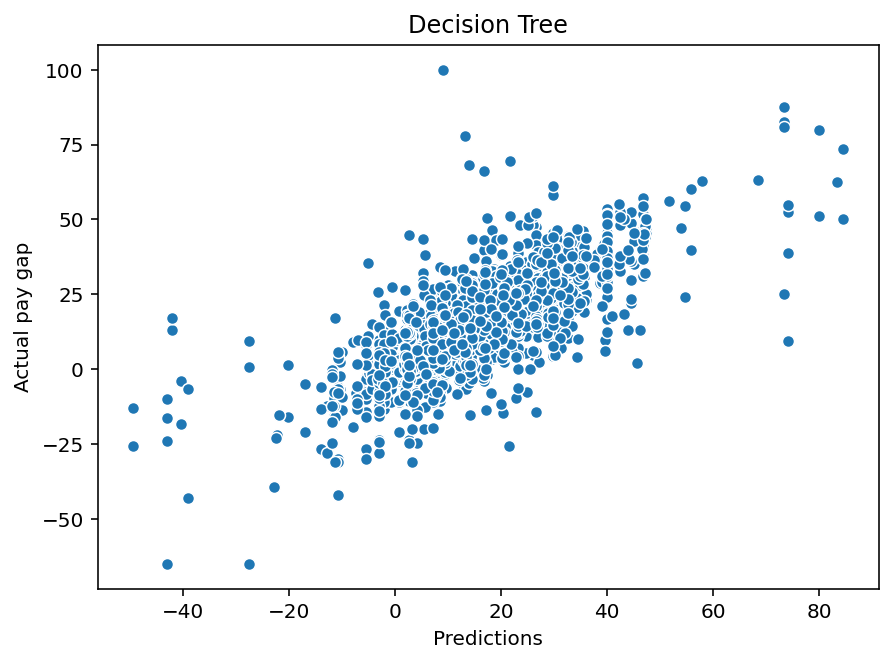

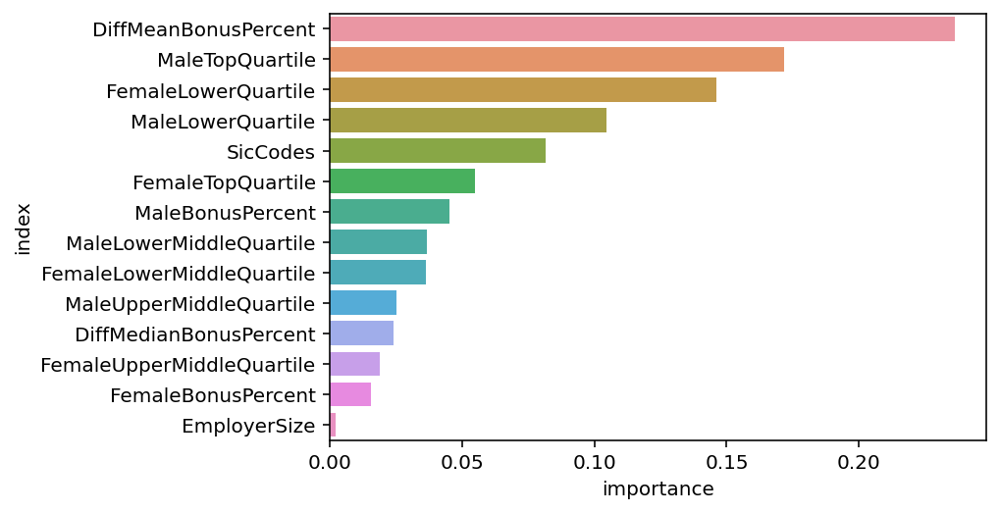

In [158]:
correlatePredictions(decision_tree_model,val_X,val_y,"Decision Tree")
feature_imp(decision_tree_model,train_X)